In [5]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
from sklearn.model_selection import train_test_split

In [7]:
from sklearn.preprocessing import MinMaxScaler

In [8]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense

In [9]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score

In [10]:
df = pd.read_csv('../DATA/kc_house_data.csv')

In [11]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [12]:
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [13]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
id,21597.0,4.580474e+09,2.876736e+09,1.000102e+06,2.123049e+09,3.904930e+09,7.308900e+09,9.900000e+09
price,21597.0,5.402966e+05,3.673681e+05,7.800000e+04,3.220000e+05,4.500000e+05,6.450000e+05,7.700000e+06
bedrooms,21597.0,3.373200e+00,9.262989e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,3.300000e+01
bathrooms,21597.0,2.115826e+00,7.689843e-01,5.000000e-01,1.750000e+00,2.250000e+00,2.500000e+00,8.000000e+00
sqft_living,21597.0,2.080322e+03,9.181061e+02,3.700000e+02,1.430000e+03,1.910000e+03,2.550000e+03,1.354000e+04
sqft_lot,21597.0,1.509941e+04,4.141264e+04,5.200000e+02,5.040000e+03,7.618000e+03,1.068500e+04,1.651359e+06
floors,21597.0,1.494096e+00,5.396828e-01,1.000000e+00,1.000000e+00,1.500000e+00,2.000000e+00,3.500000e+00
waterfront,21597.0,7.547345e-03,8.654900e-02,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00
view,21597.0,2.342918e-01,7.663898e-01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,4.000000e+00
condition,21597.0,3.409825e+00,6.505456e-01,1.000000e+00,3.000000e+00,3.000000e+00,4.000000e+00,5.000000e+00


<AxesSubplot:xlabel='price', ylabel='Count'>

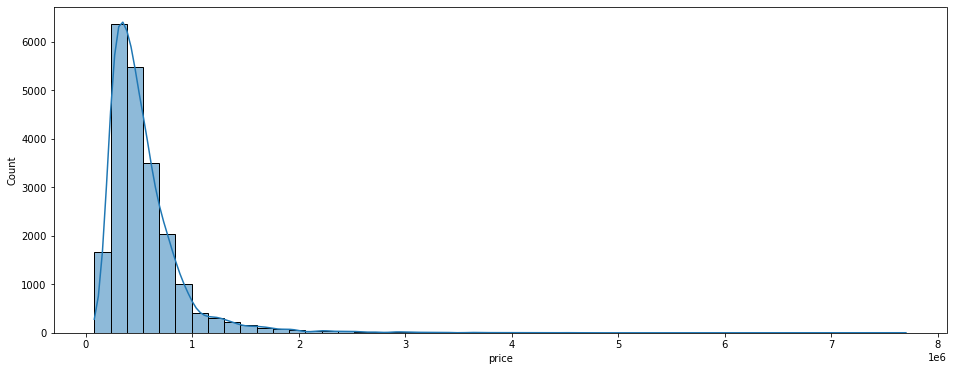

In [14]:
plt.figure(figsize=(16,6))
sns.histplot(df['price'], kde=True, bins=50)

In [15]:
#Remove expensive houses
df.drop(df[df['price'] >= 4000000].index, inplace=True)

<AxesSubplot:xlabel='price', ylabel='Count'>

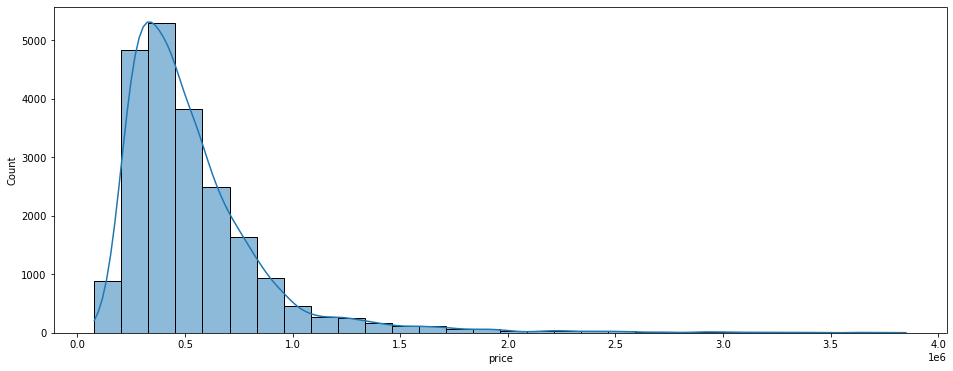

In [16]:
plt.figure(figsize=(16,6))
sns.histplot(df['price'], kde=True, bins=30)

<AxesSubplot:xlabel='bedrooms', ylabel='count'>

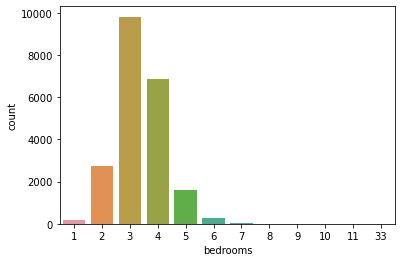

In [17]:
sns.countplot(x=df['bedrooms'])

In [18]:
df.corr()['price'].sort_values()

zipcode         -0.051329
id              -0.022285
long             0.024445
condition        0.040530
yr_built         0.054025
sqft_lot15       0.084827
sqft_lot         0.092214
yr_renovated     0.123524
waterfront       0.248934
floors           0.264066
bedrooms         0.311148
sqft_basement    0.312555
lat              0.320065
view             0.397575
bathrooms        0.520752
sqft_living15    0.597597
sqft_above       0.598485
grade            0.677932
sqft_living      0.694163
price            1.000000
Name: price, dtype: float64

<AxesSubplot:xlabel='price', ylabel='sqft_living'>

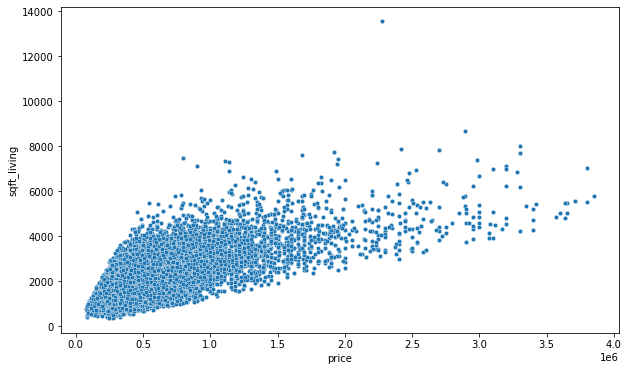

In [19]:
plt.figure(figsize=(10,6))
sns.scatterplot(x='price', y='sqft_living', data=df, s=20)

<AxesSubplot:xlabel='bedrooms', ylabel='price'>

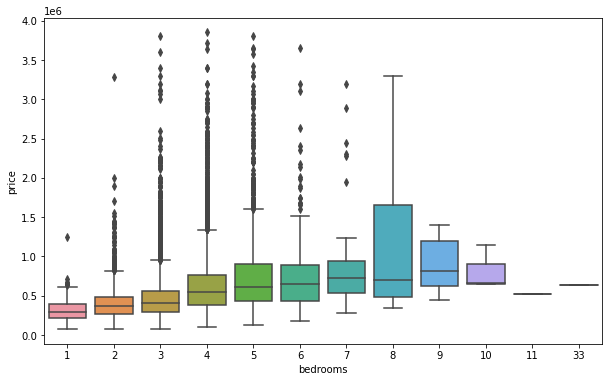

In [20]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='bedrooms', y='price')

In [21]:
df.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

<AxesSubplot:xlabel='long', ylabel='lat'>

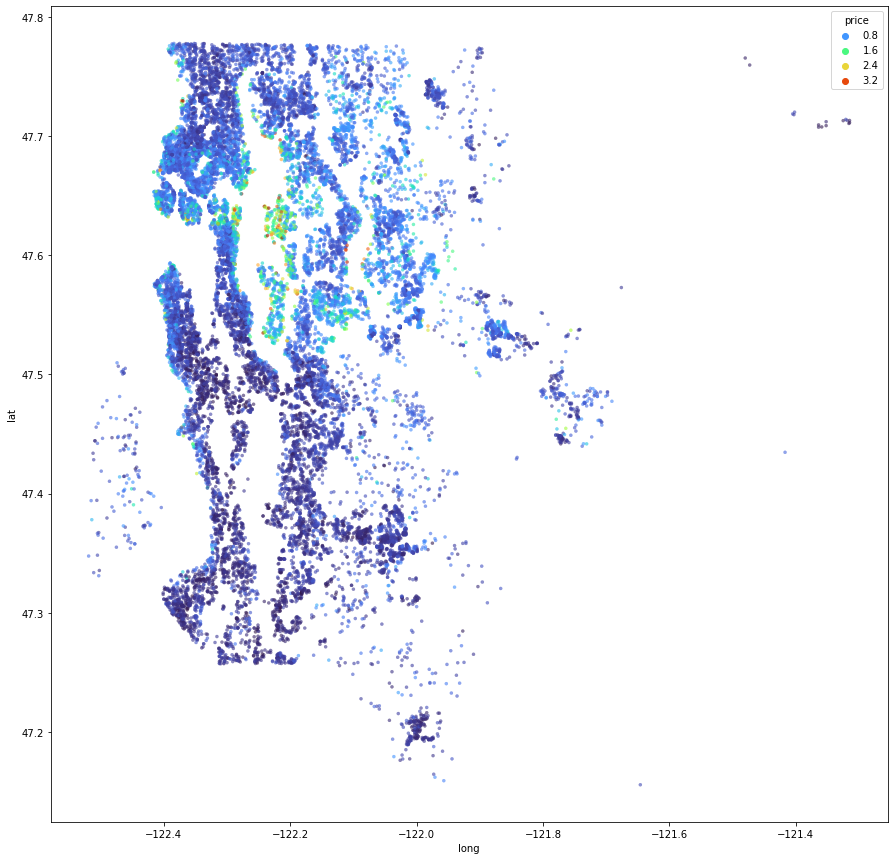

In [22]:
plt.figure(figsize=(15,15))
sns.scatterplot(data=df, x='long', y='lat', s=10, hue='price', edgecolor=None, alpha=0.6, palette='turbo')

<AxesSubplot:xlabel='price', ylabel='long'>

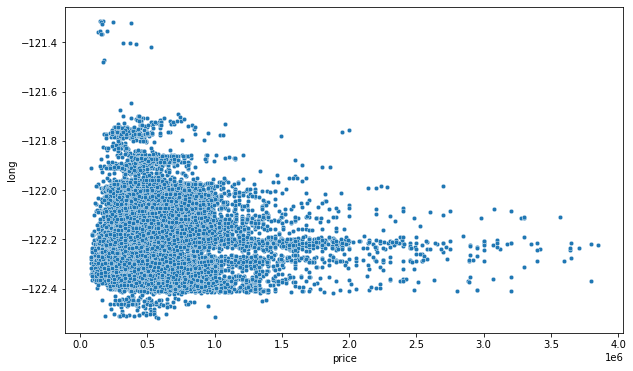

In [23]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='price', y='long', s=20)

<AxesSubplot:xlabel='price', ylabel='lat'>

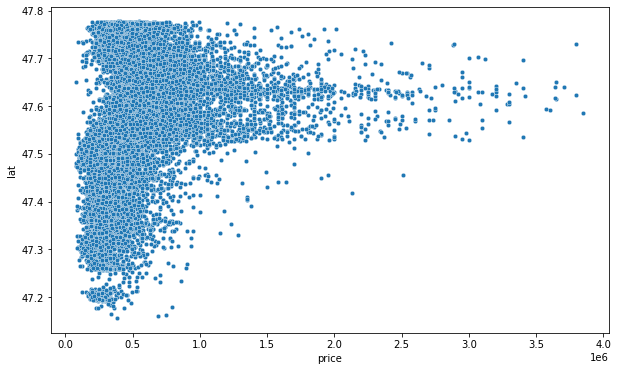

In [24]:
plt.figure(figsize=(10,6))
sns.scatterplot(data=df, x='price', y='lat', s=20)

<AxesSubplot:xlabel='waterfront', ylabel='price'>

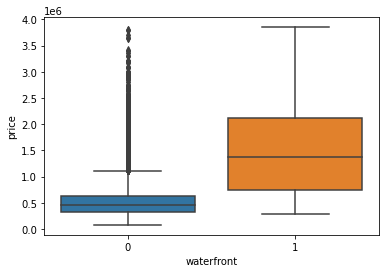

In [25]:
sns.boxplot(data=df, x='waterfront', y='price')

In [26]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


In [27]:
df = df.drop('id', axis=1)

In [28]:
df['date'] = pd.to_datetime(df['date']) 

In [29]:
df['year'] = df['date'].dt.year

In [30]:
df['month'] = df['date'].dt.month

In [31]:
df.head()

,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,3,...,0,1955,0,98178,47.5112,-122.257,1340,5650,2014,10
1,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,3,...,400,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12
2,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,3,...,0,1933,0,98028,47.7379,-122.233,2720,8062,2015,2
3,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,5,...,910,1965,0,98136,47.5208,-122.393,1360,5000,2014,12
4,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,3,...,0,1987,0,98074,47.6168,-122.045,1800,7503,2015,2


<AxesSubplot:xlabel='month', ylabel='price'>

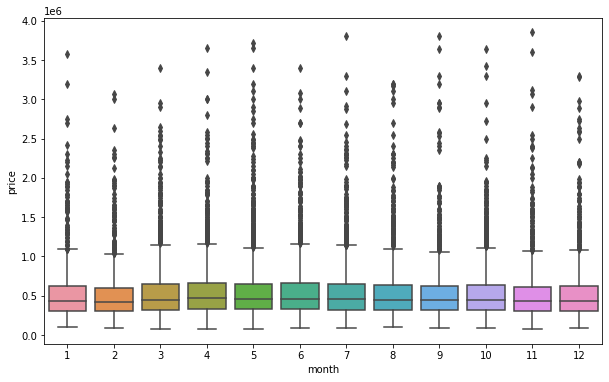

In [32]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='month', y='price')

<AxesSubplot:xlabel='month'>

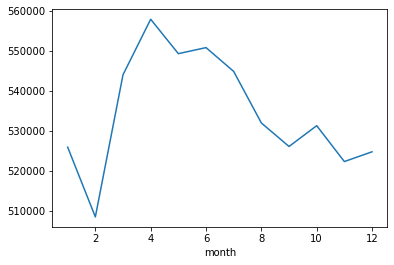

In [33]:
df.groupby('month').mean()['price'].plot()

In [34]:
df = df.drop('date', axis=1)

In [35]:
df.columns

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_above',
       'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'year', 'month'],
      dtype='object')

In [36]:
df.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,0,1955,0,98178,47.5112,-122.257,1340,5650,2014,10
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,400,1951,1991,98125,47.7210,-122.319,1690,7639,2014,12
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,0,1933,0,98028,47.7379,-122.233,2720,8062,2015,2
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,910,1965,0,98136,47.5208,-122.393,1360,5000,2014,12
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,0,1987,0,98074,47.6168,-122.045,1800,7503,2015,2


In [37]:
df['zipcode'].value_counts()

98103    602
98038    589
98115    583
98052    574
98117    553
        ... 
98102    103
98010    100
98024     80
98148     57
98039     47
Name: zipcode, Length: 70, dtype: int64

In [38]:
df = df.drop('zipcode', axis=1)

In [39]:
df['yr_renovated'].value_counts()

0       20674
2014       91
2013       37
2003       36
2000       35
        ...  
1934        1
1959        1
1951        1
1948        1
1944        1
Name: yr_renovated, Length: 70, dtype: int64

In [40]:
df['sqft_basement'].value_counts()

0       13109
600       221
700       218
500       214
800       206
        ...  
2600        1
1481        1
1913        1
266         1
248         1
Name: sqft_basement, Length: 301, dtype: int64

In [41]:
#Feature-target split
#TensorFlow does not handle DataFrames well, so use np.value
X = df.drop('price', axis=1).values
y = df['price'].values

In [42]:
#Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

In [43]:
#Scale training features
scaler = MinMaxScaler()

In [44]:
X_train = scaler.fit_transform(X_train)

In [45]:
#Only transform, as we do not have information on the contents of X_test
X_test = scaler.transform(X_test)

In [46]:
X_train.shape

(15109, 19)

In [47]:
model = Sequential()

#Set number of neurons in each layer to number of features available = 19
#Use ReLU function for activation
#Add four layers to the neural network
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))
model.add(Dense(19, activation='relu'))

#Final output layer
model.add(Dense(1))

#Compile using Adam optimizer and Mean Squared Error as loss metric for our continuous price
model.compile(optimizer='adam', loss='mse')

In [48]:
#Fit the NN model, and pass in validation_data for calculation of loss/cost function on validation set
#The system calculates the loss based on training data (pred - train target) and val_loss on test data (pred - test target)
#As the dataset is large, do training in batches
model.fit(x=X_train, y=y_train, 
          validation_data=(X_test, y_test), 
          batch_size=128, 
          epochs=400)

====] - 0s 1ms/step - loss: 27918825472.0000 - val_loss: 29886685184.0000
Epoch 239/400
119/119 [==============================] - 0s 1ms/step - loss: 27908468736.0000 - val_loss: 29863022592.0000
Epoch 240/400
119/119 [==============================] - 0s 1ms/step - loss: 27877834752.0000 - val_loss: 29880967168.0000
Epoch 241/400
119/119 [==============================] - 0s 1ms/step - loss: 27861983232.0000 - val_loss: 29889314816.0000
Epoch 242/400
119/119 [==============================] - 0s 1ms/step - loss: 27864461312.0000 - val_loss: 29848018944.0000
Epoch 243/400
119/119 [==============================] - 0s 1ms/step - loss: 27830882304.0000 - val_loss: 29812946944.0000
Epoch 244/400
119/119 [==============================] - 0s 1ms/step - loss: 27848687616.0000 - val_loss: 29855410176.0000
Epoch 245/400
119/119 [==============================] - 0s 1ms/step - loss: 27810398208.0000 - val_loss: 29812576256.0000
Epoch 246/400
119/119 [==============================] - 0s 1ms/s

In [49]:
#Grab loss values
NN_history = pd.DataFrame(model.history.history)

<AxesSubplot:>

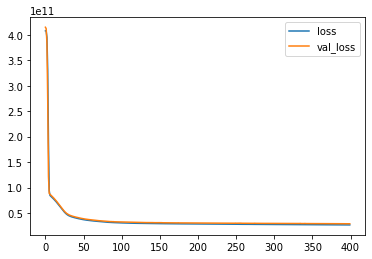

In [50]:
NN_history.plot()

In [51]:
#Predict on test set
predictions = model.predict(X_test)

In [52]:
#RMSE between Y-True and our Predictions
np.sqrt(mean_squared_error(y_test, predictions))

169542.58305749408

In [53]:
#MAE between Y-True and our Predictions
mean_absolute_error(y_test, predictions)

104483.21440616794

In [54]:
#Compare RMSE and MAE with the average house price -- this shows us that 20
df['price'].describe()

count    2.158500e+04
mean     5.375925e+05
std      3.480460e+05
min      7.800000e+04
25%      3.220000e+05
50%      4.500000e+05
75%      6.450000e+05
max      3.850000e+06
Name: price, dtype: float64

In [55]:
explained_variance_score(y_test, predictions)

0.7670689843376388

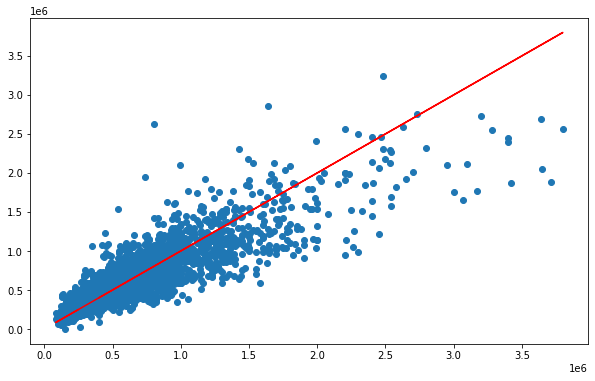

In [56]:
plt.figure(figsize=(10,6))
plt.scatter(y_test, predictions)
plt.plot(y_test, y_test, 'r') #Perfect prediction line

In [57]:
#Predict on a random house from the train set
random_house = df.drop('price', axis=1).iloc[0]

In [58]:
#Scale the random house features values into the same MinMaxScale used earlier
#Grab values and reshape into a 2-D array
random_house = scaler.transform(random_house.values.reshape(-1,19))

In [59]:
model.predict(random_house)

array([[283824.6]], dtype=float32)

In [60]:
df.iloc[0]

price            221900.0000
bedrooms              3.0000
bathrooms             1.0000
sqft_living        1180.0000
sqft_lot           5650.0000
floors                1.0000
waterfront            0.0000
view                  0.0000
condition             3.0000
grade                 7.0000
sqft_above         1180.0000
sqft_basement         0.0000
yr_built           1955.0000
yr_renovated          0.0000
lat                  47.5112
long               -122.2570
sqft_living15      1340.0000
sqft_lot15         5650.0000
year               2014.0000
month                10.0000
Name: 0, dtype: float64